## This notebook judges whether a vehicle is damaged or not

### Importing necessary libs

In [1]:
from fastcore.all import *
import time

def search_images(term,max_images=250):
    """
    To search for images and download them along with labels.
    We will be downloading them for duckduckgo
    """
    download_url = "https://duckduckgo.com/"
    res = urlread(download_url,data = {'q':term})
    search_obj = re.search(r'vqd=([\d-]+)\&',res)
    request_url = download_url + 'i.js'
    params = dict(l='us-en',o='json',q=term,vqd=search_obj.group(1),f='...',p='1',v7exp='a')
    urls,data = set(),{'next':1}
    while len(urls) < max_images and 'next' in data:
        data = urljson(request_url,data=params)
        urls.update(L(data['results']).itemgot('image'))
        request_url = download_url + data['next']
        time.sleep(0.2)
    return L(urls)[:max_images]


In [2]:
urls = search_images('damaged vehicle',max_images=1)
urls[0]

'https://thumbs.dreamstime.com/b/badly-damaged-car-accident-road-trhat-has-been-involved-damage-to-front-wing-hood-35911477.jpg'

### Previewing the images and making sure that the words used for searching are correct

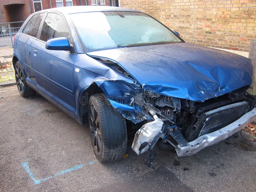

In [3]:
from fastdownload import download_url
dest = "damaged_vehicle.jpg"
download_url(urls[0],dest,show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

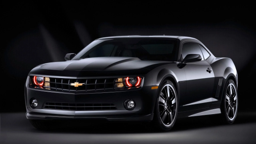

In [4]:
car_urls = search_images('car',max_images=1)
dest = "normal_car.jpg"
download_url(car_urls[0],dest,show_progress=False)

im = Image.open(dest)
im.to_thumb(256,256)

### Downloading the images

In [5]:
searches = 'damaged vehicle','car'
path = Path('damaged_or_not')

for search in searches:
    dest = (path/search)
    dest.mkdir(exist_ok=True,parents=True)
    download_images(dest,urls=search_images(f'{search} images'))
    resize_images(path/search,max_size=400,dest=path/search)


### Looking for the images that have failed to download and removing them so that they are not considered for the training

In [9]:
path = Path('damaged_or_not')

failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
print(f'The number of failed downloads are: {len(failed)}')

The number of failed downloads are: 0


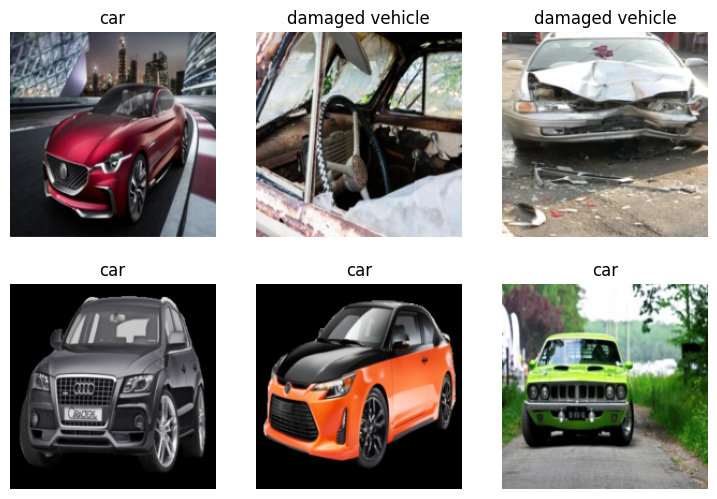

In [10]:
dls = DataBlock(
    blocks = (ImageBlock,CategoryBlock),
    get_items=get_image_files,
    splitter = RandomSplitter(valid_pct=0.2,seed=42),
    get_y = parent_label,
    item_tfms = [Resize(192,method='squish')]
).dataloaders(path)

dls.show_batch(max_n=6)

In [11]:
learn = vision_learner(dls,resnet18,metrics = error_rate)
learn.fine_tune(3)

epoch,train_loss,valid_loss,error_rate,time
0,0.898544,0.236071,0.085106,00:08


epoch,train_loss,valid_loss,error_rate,time
0,0.330041,0.178664,0.085106,00:11
1,0.184870,0.104299,0.053191,00:11
2,0.127005,0.068549,0.021277,00:10
3,0.098560,0.082614,0.031915,00:10


In [12]:
is_damaged,_,probs = learn.predict(PILImage.create("normal_car.jpg"))
print(f"This is a {is_damaged}")
print(f"The probability that this is a {is_damaged} is: {probs[0]:.4f}")

This is a car
The probability that this is a car is: 1.0000


In [13]:
is_damaged,_,probs = learn.predict(PILImage.create("damaged_vehicle.jpg"))
print(f"This is a {is_damaged}")
print(f"The probability that this is a {is_damaged} is: {probs[0]:.4f}")

This is a damaged vehicle
The probability that this is a damaged vehicle is: 0.0000


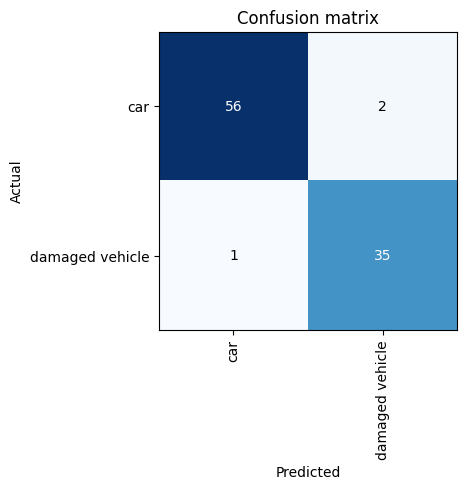

In [17]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

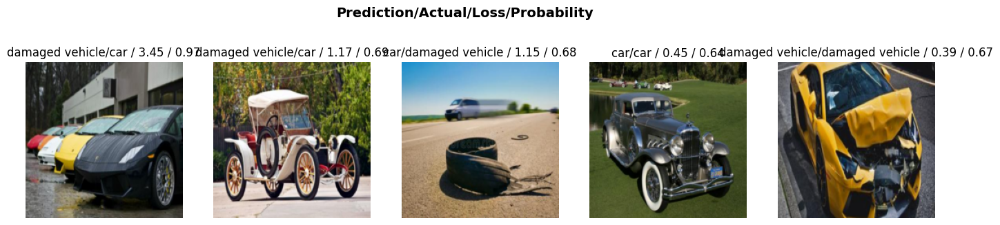

In [18]:
interp.plot_top_losses(5,nrows=1,figsize=(17,4))

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [ ]:
learn.export("model.pkl")